In [1]:
import pandas as pd
import numpy as np
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util

from matplotlib import pyplot as plt
import seaborn as sns
pd.options.display.max_columns = None
pd.set_option('display.max_rows',None)
sns.set_style('dark')

#PCA packages
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.datasets import load_digits
from scipy import stats
#improve resolution
#comment this line if erroring on your machine/screen
%config InlineBackend.figure_format ='retina'

ImportError: No module named spotipy

### Import Data 

In [ ]:
data_2020 = pd.read_csv('/Users/ruibozhang/Documents/GitHub/group045_fa20/2020spotify_results.csv')
data_2020 = data_2020.dropna()

def is_grammy(string_name):
    #lowercase
    string_name = string_name.lower()

    grammy_2020_list = ['black parade','kaydence','caso','the box',
    'cardigan','circles','don\'t start now','everything i wanted',
    'i can\'t breathe','if theworld was ending']

    #save desired rows, make others null
    if(string_name in grammy_2020_list):
        return 'Grammy'
    else:
        return 'None'

#extract grammy data from dataset
grammy_2021_data = data_2020
grammy_2021_data ['name'] = grammy_2021_data['name'].apply(is_grammy)
grammy_2021_data = grammy_2021_data.dropna()

In [ ]:
#Drop useless columns
data_2020 = data_2020.drop(['mode','artists','id','type','uri','track_href','analysis_url','instrumentalness'], axis=1)
grammy_2021_data = grammy_2021_data.drop(['mode','artists','id','type','uri','instrumentalness','track_href','analysis_url'], axis=1)
#dropped 'instrumentalness' because no song that won Grammy is instrumental

In [ ]:
df_g= data_2020[data_2020['name'] == 'Grammy']
df_n= data_2020[data_2020['name'] == 'None']

# EDA Process

### Data Description 

The original dataset is obtianed through API from Spotify Website. It contains songs released in 2020 and their revelant infomation/ attributes. The dataset contains 32294 samples and 13 attributes. <br/>
The dataset is further divided into songs that won the 2020 Grammy Awards and songs that did  not. In total, 15 songs won 2021 Grammy Awards, 32294 songs did not; both types of songs have 13 attributes we would like to analyze.

In [ ]:
print('Songs with 2021 Grammy awards ',df_g.shape)
print('Songs without Grammy awards in 2020',df_n.shape)

In [ ]:
df_g = df_g.reset_index(drop = True)

Below are the main characteristics of each attribute for songs that have won the 2021 Grammy Awards.

In [ ]:
df_g.describe()

Below are the main characteristics of each attribute for songs that did not win the 2021 Grammy Awards.

In [ ]:
df_n.describe()

### Covariance and Heatmap

In [2]:
features = ['popularity','danceability','energy','key','loudness','speechiness','acousticness','liveness','valence']
df = data_2020[features]
df.head()

NameError: name 'data_2020' is not defined

In [3]:
corr = df.corr()
corr

NameError: name 'df' is not defined

In [4]:
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
           cmap="magma_r")

NameError: name 'sns' is not defined

From the correlation matrix and the heatmap, we can see that key, speechiness,liveness and valence are not really related to the popularity of the song.

### Comparison of music features (Grammy/not Grammy)

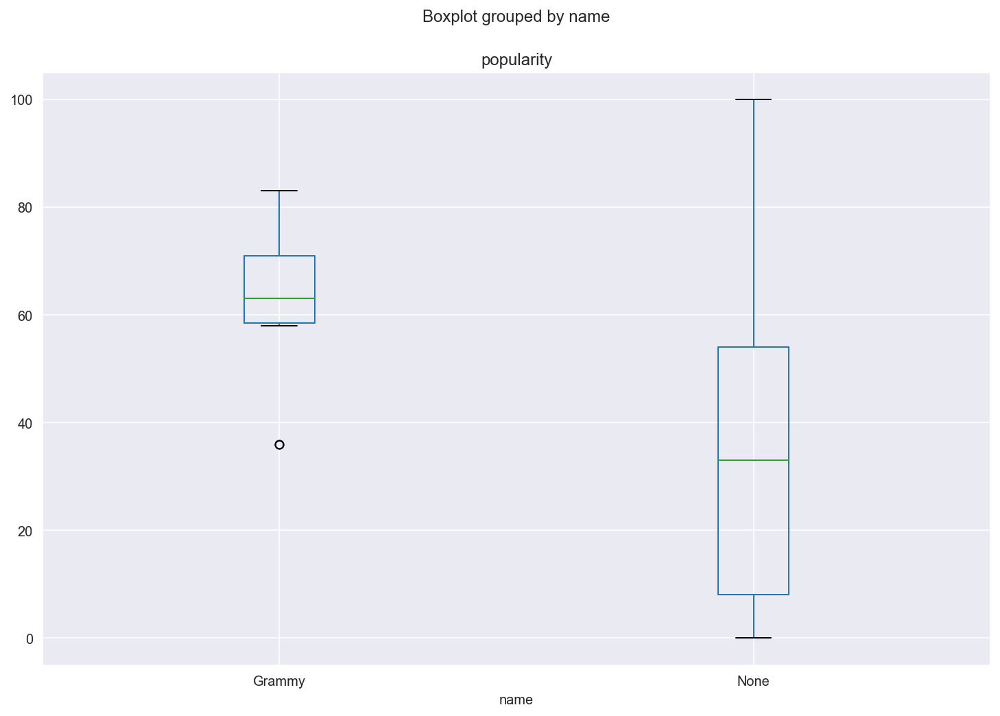

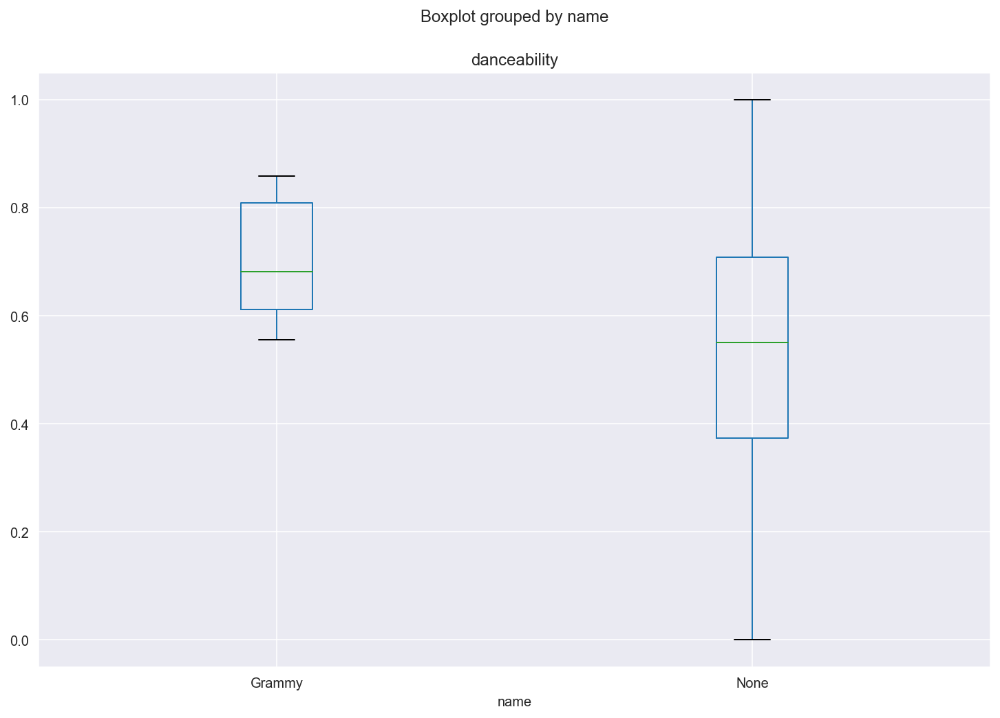

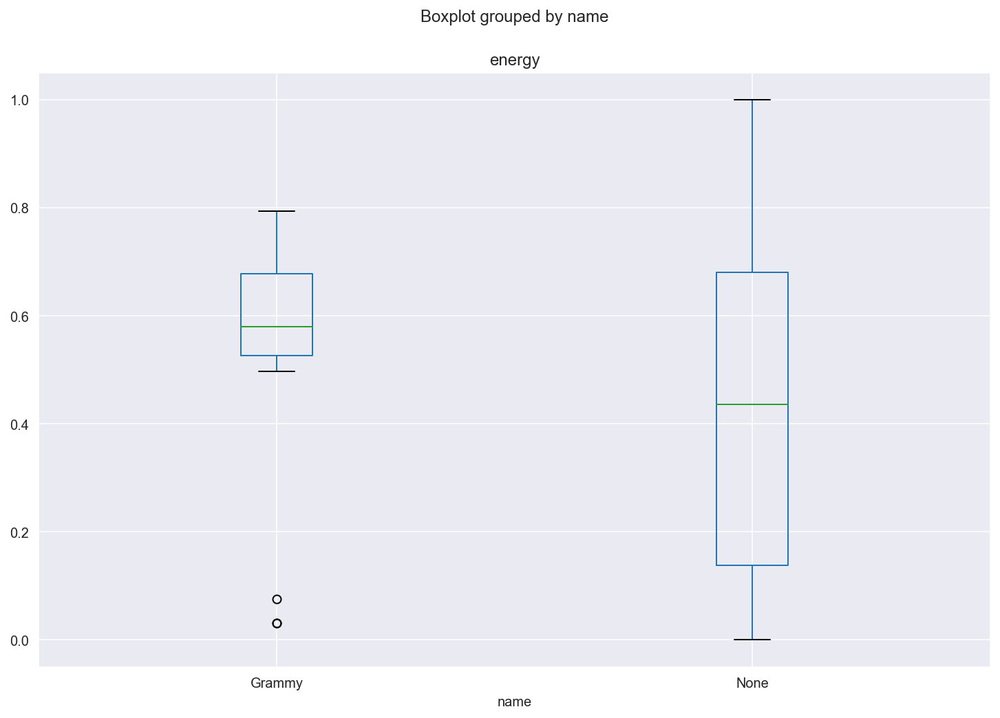

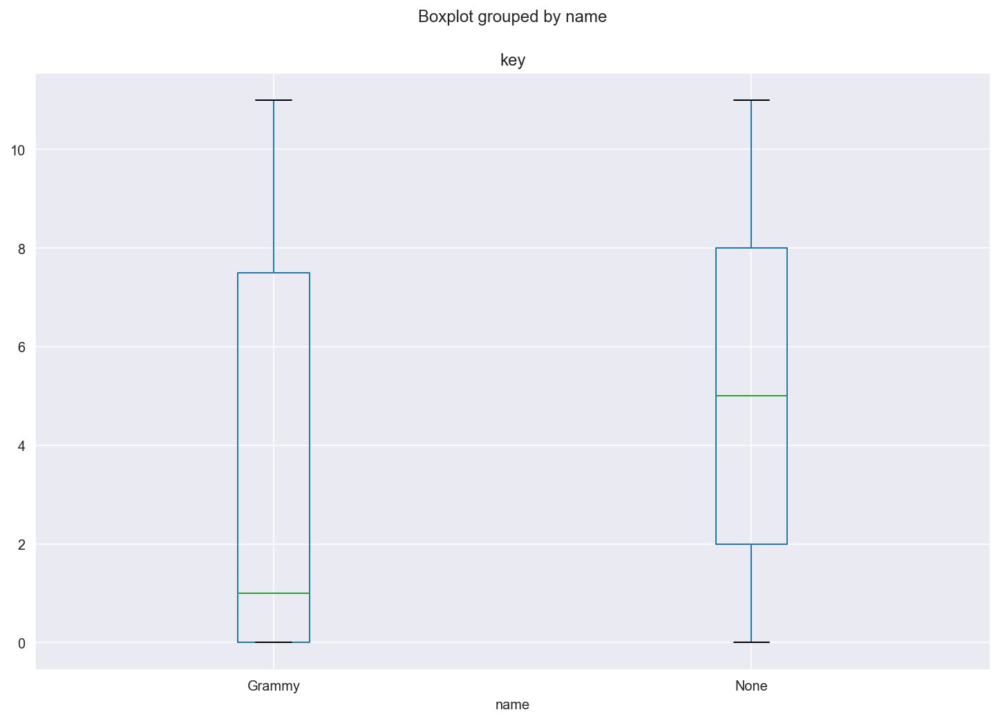

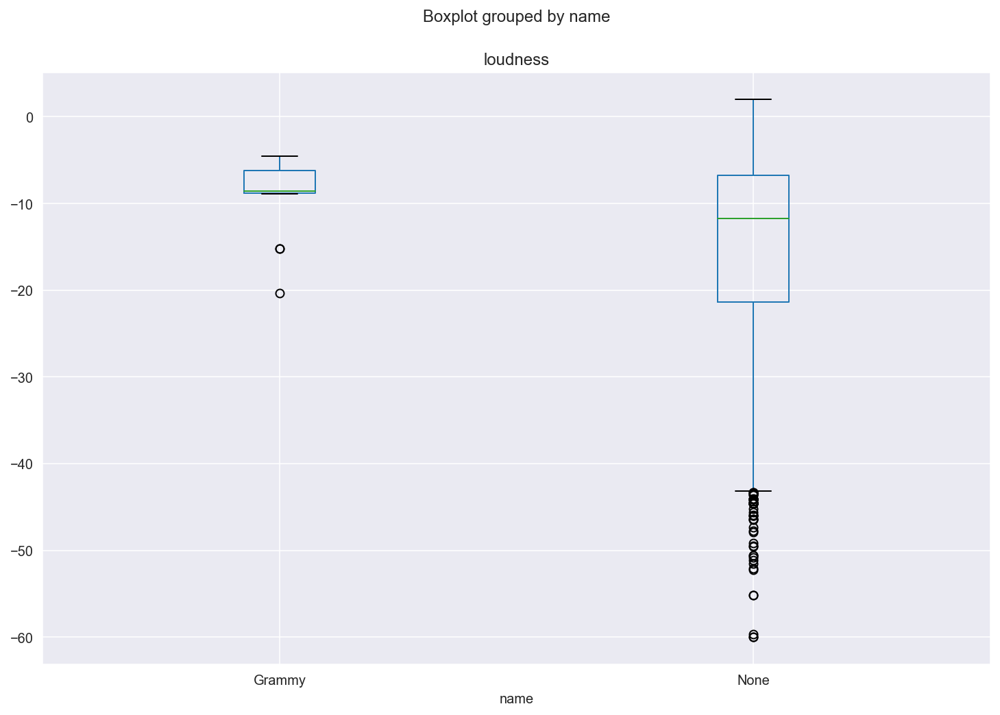

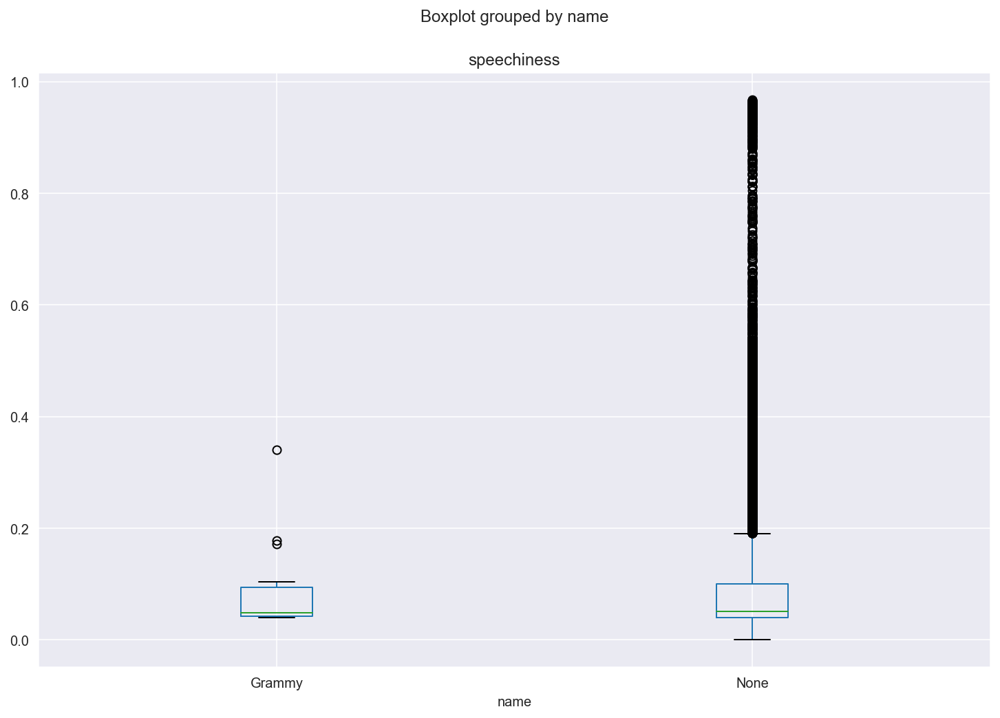

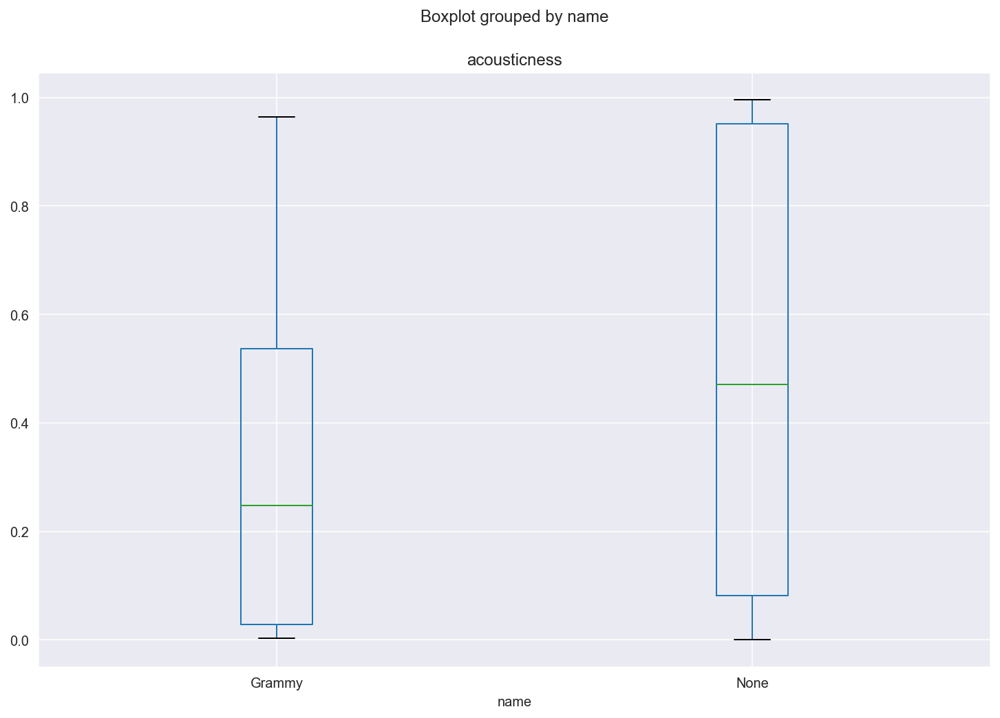

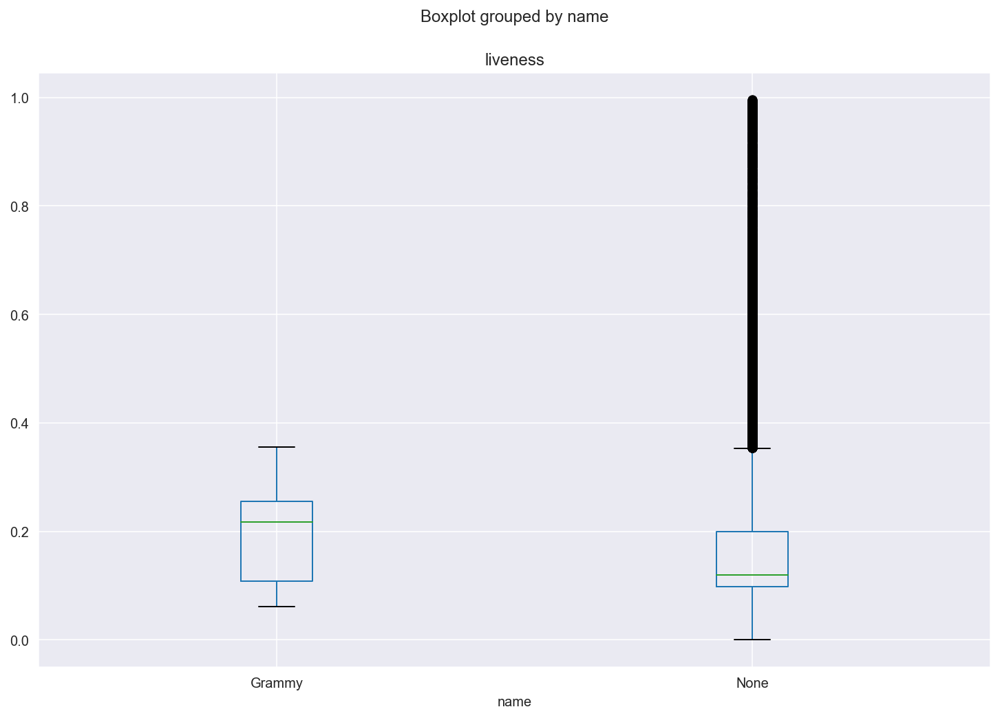

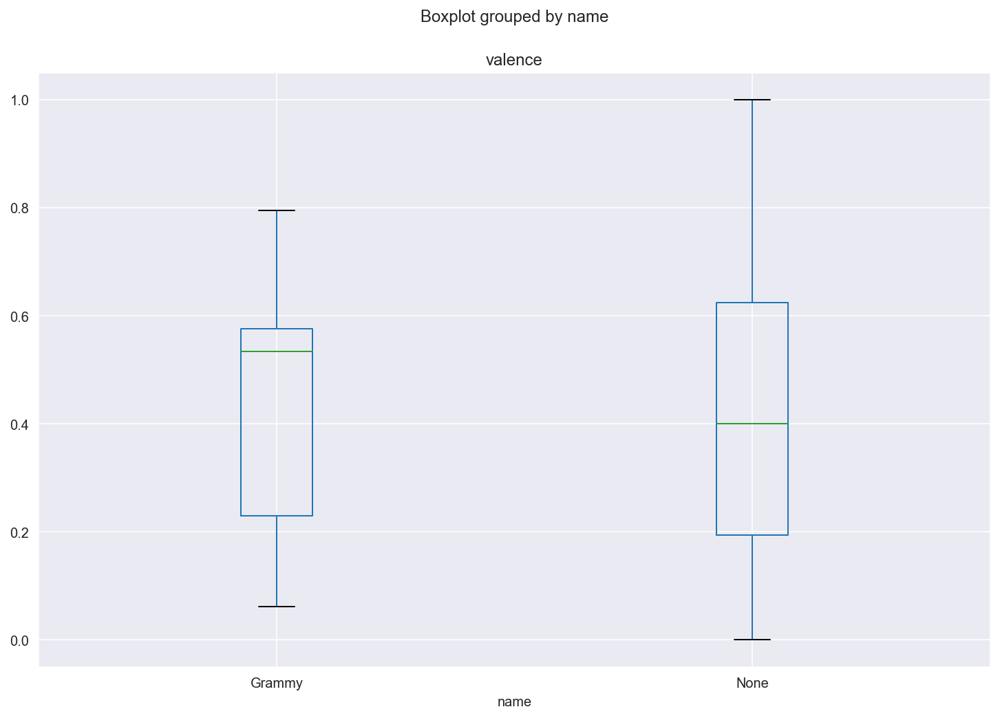

In [28]:
for colname in features:
    data_2020.boxplot(colname, by='name', figsize=(12, 8))

From the boxplots above, we can roughly compare the distribution of different variables in 2020 Spotify songs that have won 2021 Grammy Award and 2020 Spotify songs that have not won 2021 Grammy Award. We may make the assumption that the features 'popularity','danceability','energy','key','acousticness','liveness','valence' can possibily differentiate the two types of songs. 

### PCA for EDA Process 

In [15]:
#split data table into predictors and outcome
data_2020_pred = data_2020.iloc[:,1:].values
data_2020_gng = data_2020.iloc[:,0].values


In [16]:
# calculate PCs
pca = PCA(n_components=4)
data_2020_pca_fit = pca.fit(data_2020_pred)
data_2020_PCs = pca.fit_transform(data_2020_pred)

In [17]:
# See PCs
print(data_2020_pca_fit.components_)

[[-4.90978744e-06 -1.99379540e-07  1.79715165e-07 -4.17342411e-07
   8.79883861e-06 -1.14031965e-07 -1.19386006e-07  4.31516136e-08
  -3.30263416e-07  1.03802304e-06  1.00000000e+00  3.19650673e-07]
 [ 2.06332269e-01  1.85652915e-03  2.87072860e-03  1.13747767e-03
   9.17462008e-02  4.85816878e-04 -3.75282863e-03 -2.60435516e-06
   1.87732192e-03  9.74150289e-01 -8.05858157e-07  3.16512505e-03]
 [ 9.59978270e-01  3.57171003e-03  4.96420809e-03  1.44620922e-03
   1.73383296e-01  7.38159963e-04 -7.26149589e-03 -7.89536106e-06
   8.65837395e-04 -2.19722488e-01  3.41479166e-06  2.90961133e-03]
 [ 1.89338222e-01 -1.15524313e-02 -2.59698083e-02 -7.58464668e-04
  -9.79672587e-01 -2.51197125e-03  2.49652996e-02 -3.22650550e-03
  -1.18548516e-02  5.24073134e-02  9.49857316e-06 -7.55941718e-03]]


In [18]:
print(data_2020_pca_fit.explained_variance_ratio_)

[9.99999849e-01 9.65299540e-08 4.88392138e-08 4.83234166e-09]


Text(0.0, 1.0, 'Plot to find Principle Component')

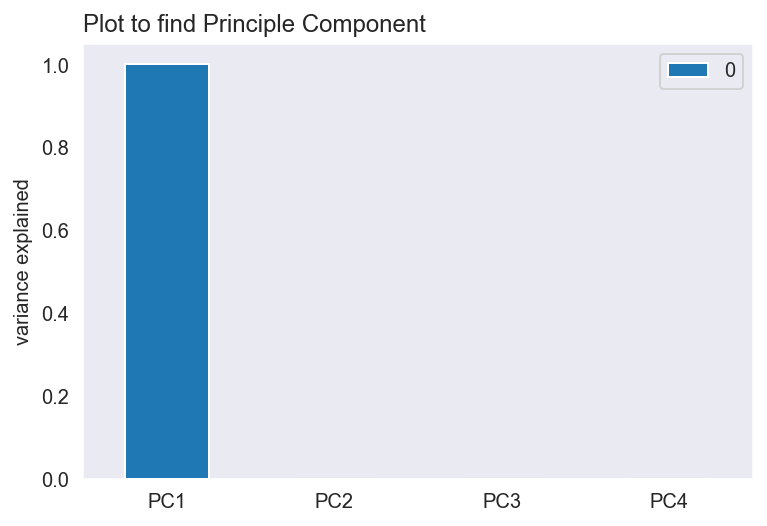

In [25]:
var_exp = pd.DataFrame(data_2020_pca_fit.explained_variance_ratio_,
                       ['PC1', 'PC2','PC3','PC4'])
var_exp.plot.bar(rot=0)
plt.ylabel('variance explained');
plt.title('Plot to find Principle Component', loc = 'left')

From the graph we can see that PC1 explains most of the variance(close to 100%, while PC2,PC3,PC4 contains almost no information; thus they can safely be dropped without losing to much information.

In [20]:
pca_out = pd.DataFrame(data_2020_PCs, columns=['PC1','PC2','PC3','PC4'])
pca_out['name'] = data_2020['name']
pca_out

,PC1,PC2,PC3,PC4,name
0,4.630848e+04,63.428260,45.899522,8.194324,None
1,2.948484e+03,-9.133374,50.461464,-0.382871,None
2,-3.443852e+04,65.322963,35.658089,3.106580,None
3,2.430748e+04,33.729412,41.688453,3.186993,None
4,2.429548e+04,29.208645,20.564786,-0.977763,None
5,1.794848e+04,-22.082849,52.340667,-0.690410,None
6,2.430748e+04,24.778354,-0.583590,-5.115801,None
7,3.394848e+04,29.168437,21.880611,3.206936,None
8,3.332448e+04,24.274623,-0.172899,-1.134344,None
9,-4.387952e+04,69.608064,34.154572,0.561896,None


Text(0.0, 1.0, 'PCA Result')

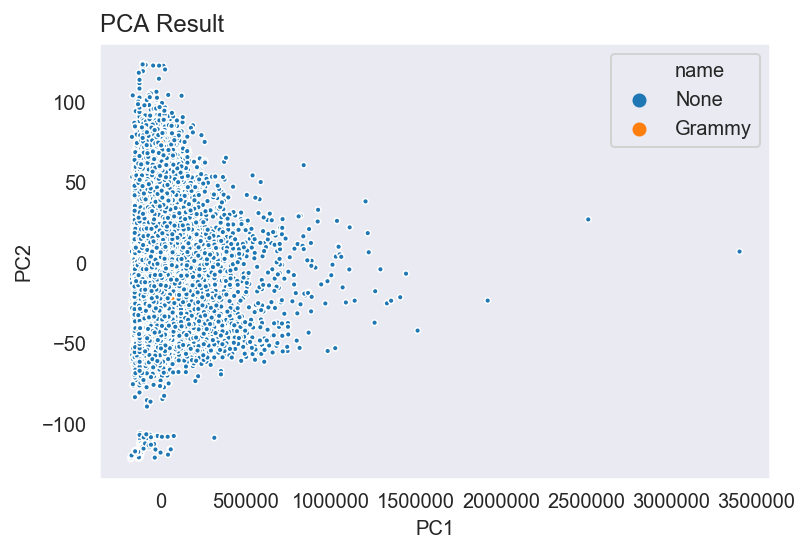

In [24]:
# plot PC1 and PC2
# color by grammy or no grammy
sns.scatterplot(x='PC1', y='PC2', hue='name', s=8, data=pca_out);
plt.title('PCA Result', loc='left')

Although the result is not very obvious from graph but when we look at the first 2 principle components of the dataset, the songs that have won the Grammy Awards cannot be distinguished from those that did not, as we can see most of the orange points (Grammy Awards songs)  line behind the blue points (No Grammy Awards songs). The failure of PCA method on the two dataset may be the result of drastically different sizes of the two dataset, since one of them has 32294 samples, while the other has only 15 samples. 

# Data Analysis

In [54]:
df.columns

Index(['popularity', 'danceability', 'energy', 'key', 'loudness',
       'speechiness', 'acousticness', 'liveness', 'valence'],
      dtype='object')

In [60]:
df.mean()

popularity      32.527098
danceability     0.534158
energy           0.427623
key              5.181528
loudness       -14.389094
speechiness      0.105164
acousticness     0.503005
liveness         0.181622
valence          0.420093
dtype: float64

Randomly sample the same number of observations from the first group and do the comparison, recording the results. Then, you would do that many times to see how consistent the results are and take the mean/SD (or something similar) across those multiple comparisons for each feature of interest.

The feature selection is based on fomer result of boxplot

In [61]:
# rand_pop_m=[]
# rand_pop_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_pop_m.append(s1.mean()[0])
#     rand_pop_s.append(s1.std()[0])
# rand_danc_m=[]
# rand_danc_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_danc_m.append(s1.mean()[1])
#     rand_danc_s.append(s1.std()[1])
# rand_ener_m=[]
# rand_ener_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_ener_m.append(s1.mean()[2])
#     rand_ener_s.append(s1.std()[2])
# rand_key_m=[]
# rand_key_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_key_m.append(s1.mean()[3])
#     rand_key_s.append(s1.std()[3])
# rand_live_m=[]
# rand_live_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_live_m.append(s1.mean()[7])
#     rand_live_s.append(s1.std()[7])
# rand_vale_m=[]
# rand_vale_s=[]
# for i in range(100):
#     s1 = df_n.sample(n = 15) 
#     rand_vale_m.append(s1.mean()[8])
    rand_vale_s.append(s1.std()[8])



In [62]:
# g_pop_m = df_g.mean()[0]
# g_pop_s =df_g.std()[0]
# g_danc_m = df_g.mean()[1]
# g_danc_s = df_g.std()[1]
# g_ener_m= df_g.mean()[2]
# g_ener_s = df_g.std()[2]
# g_key_m = df_g.mean()[3]
# g_key_s = df_g.std()[3]
# g_live_m = df_g.mean()[7]
# g_live_s = df_g.std()[7]
# g_vale_m = df_g.mean()[8]
# g_vale_s = df_g.std()[8]


In [104]:
# place all the p values in each rows into a 9*100 list
result_lst= np.zeros((9,100))
for col,j in zip(features,range(9)):
    for i in range(100):
        s1 = df_n.sample(n = 15)
        result = stats.ttest_ind(s1[col],df_g[col])
        result_lst[j][i] = result[1]
# I computed the average of each p- value but I don't think this is how it can work 
for k in range(9):
    print(sum(result_lst[k])/len(result_lst[k]))

0.002746125257155831
0.04410476677814286
0.4109390733099502
0.4043106665615006
0.13725301394756445
0.5386610418574679
0.3791830624579689
0.5178861689091628
0.602386038047337
